# Selección de cripto activos para una cartera de inversión

![picture](https://drive.google.com/uc?export=view&id=1ihM3JEKP-XPaoX9b5bwymu_IF4ntTlz-)

# Trabajo Práctico 4 - Aprendizaje No Supervisado

# Introducción

En finanzas, encontrar grupos de activos similares o regímenes en el comportamiento de los precios es de mucha utilidad, y es de gran ayuda en el desarrollo de filtros, definición de reglas de compra/venta, etc. 

En este práctico aplicaremos métodos de aprendizaje no supervisado. Estas metodologías en muchos casos son aplicadas antes de las de aprendizaje supervisado, dado que frecuentemente nos permiten obtener información útil de nuestros datos.

Podemos destacar métodos como clustering y reducción de dimensionalidad. Algunas de las metodologías despliegan su máximo potencial cuando se dispone de grandes cantidades de datos (activos en nuestro caso).

# 📖 ¡Actividades!

Analizaremos las variaciones (tasas de cambio) de los activos en ventanas específicas de tiempo. Nuestro objetivo será encontrar activos con comportamiento similiar en término de sus retornos.

Para esta actividad seleccionen periodos en los cuales esté disponible la data de todos los activos. 

## Parte I 

Una forma sencilla de predecir el comportamiento de los activos sería suponer que todos siguen el mismo modelo de aprendizaje automático y crear este modelo global para predecir los rendimientos de todos los activos. Sin embargo, es posible que ellos reaccionen de manera diferente a un conjunto de indicadores técnicos. Una forma de resolver este problema es crear un modelo diferente para grupos de activos que se espera que se comporten de manera similar.

Evaluen los siguientes algoritmos de clusterización. 

- Mean Shift.
- k-means. 
- Clustering Jerárquico 

¿Qué activos forman parte de cada cluster? ¿Encuentran alguna relación dentro de cada grupo?

## Parte II 

- Usar la medida de distancia dynamic time warping para agrupar por k-means y comparar con lo obtenido con la métrica euclídea ([link](https://towardsdatascience.com/how-to-apply-k-means-clustering-to-time-series-data-28d04a8f7da3)). Comente los resultados.

## Opcional 

- Aplicar factores dinámicos para ver si las tasas de retorno se pueden resumir en uno o unos pocos constructos subyacentes ([link](https://www.statsmodels.org/stable/examples/notebooks/generated/statespace_dfm_coincident.html))

# Fecha de entrega

- __Versión preliminar: 12/9__ 

# Condiciones de entrega

Realizar un informe en el cual se presenten los resultados y conclusiones del análisis desarrollado. El mismo debe estar pensado para un público técnico pero que desconoce los aspectos propios del problema a resolver. Dicho informe puede ser un notebook, a condición de que en el mismo se efectúe un análisis escrito suficientemente detallado de los resultados. 

In [2]:
import pandas as pd
import numpy as np
import math

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt

from scipy.stats import norm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from pylab import rcParams
import statsmodels.api as sm

from sklearn.preprocessing import MinMaxScaler

from pandas import Series, DataFrame

import seaborn as sns
import os
import time
import missingno as msno

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import precision_score, accuracy_score, recall_score, f1_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import ParameterGrid

# import xgboost as xgb

# import talib as ta
import datetime as dt

import warnings
warnings.filterwarnings("ignore") 

In [4]:
# from tslearn.clustering import TimeSeriesKMeans
# from tslearn.preprocessing import TimeSeriesScalerMeanVariance
# from tslearn.preprocessing import TimeSeriesScalerMinMax

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold

In [6]:

from sklearn.cluster import MeanShift
from sklearn import (preprocessing, decomposition)
from sklearn.metrics import silhouette_samples, silhouette_score
# from tslearn.clustering import TimeSeriesKMeans
from yellowbrick.cluster import SilhouetteVisualizer, silhouette_visualizer

In [7]:
df = pd.read_csv('../2tp_analisisYCuracion/Activos limpios con features - 2tp - Final.csv', index_col = 'Fecha')

In [5]:
df.columns

Index(['open', 'high', 'low', 'close', 'volume', 'active', 'day', 'month',
       'year', 'weekday', 'profit', 'real_volume', 'EMA5', 'EMA15', 'EMA50',
       'EMA100', 'EMA200', 'RSI5', 'RSI15', 'RSI50', 'RSI100', 'RSI200',
       'ADX5', 'ADX15', 'ADX50', 'ADX100', 'ADX200', 'STOCH_SLOWK',
       'STOCH_SLOWD', 'MACD', 'SMA_5', 'SMA_15', 'SMA_ratio', 'SMA5_Volume',
       'SMA15_Volume', 'SMA_Volume_Ratio'],
      dtype='object')

In [6]:
df.drop(columns=['EMA5', 'EMA15', 'EMA50',
       'EMA100', 'EMA200', 'RSI5', 'RSI15', 'RSI50', 'RSI100', 'RSI200',
       'ADX5', 'ADX15', 'ADX50', 'ADX100', 'ADX200', 'STOCH_SLOWK',
       'STOCH_SLOWD', 'MACD', 'SMA_5', 'SMA_15', 'SMA_ratio', 'SMA5_Volume',
       'SMA15_Volume', 'SMA_Volume_Ratio'], inplace=True)

## Parte 0 - Feature Engineer

### Funciones

In [7]:
def _extract_close(data, active):
    values = None

    if isinstance(data, Series):
        values = data.values
    else:
        if "close" in data.columns:
            values = data[data['active'] == active]['close']

    if values is None:
        raise ValueError(
            "data must be Pandas Series or DataFrame with a 'last' or 'close' column")

    return values

In [8]:
def _extract_high(data, active):
    values = None

    if isinstance(data, Series):
        values = data.values
    else:
        if "high" in data.columns:
            values = data[data['active'] == active]['high']

    if values is None:
        raise ValueError(
            "data must be Pandas Series or DataFrame with a 'last' or 'close' column")

    return values

In [9]:
def _extract_low(data, active):
    values = None

    if isinstance(data, Series):
        values = data.values
    else:
        if "low" in data.columns:
            values = data[data['active'] == active]['low']

    if values is None:
        raise ValueError(
            "data must be Pandas Series or DataFrame with a 'last' or 'close' column")

    return values

In [10]:
def STOCHRSI(data, active):
    closing_prices = _extract_close(data, active)
    return ta.STOCHRSI(closing_prices) 

In [11]:
def EMA(data, period, active):
    closing_prices = _extract_close(data, active)
    return ta.EMA(closing_prices, period)

In [12]:
def RSI(data, period, active):
    closing_prices = _extract_close(data, active)
    return ta.RSI(closing_prices, period)

In [13]:
def ADX(data, period, active):
    closing_prices = _extract_close(data, active)
    high_prices = _extract_high(data, active)
    low_prices = _extract_low(data, active)
    return ta.ADX(high_prices, low_prices, closing_prices, period)

In [14]:
def MACD(data, active, fastperiod = 12, slowperiod = 26, signalperiod  = 9):
    closing_prices = _extract_close(data, active)
    return ta.MACD(closing_prices, fastperiod, slowperiod, signalperiod)[0]

In [15]:
def STOCH(data, active):
    closing_prices = _extract_close(data, active)
    high_prices = _extract_high(data, active)
    low_prices = _extract_low(data, active)
    return ta.STOCH(high_prices, low_prices, closing_prices)

In [16]:
def add_target_n_steps(data, periods):
    target = data.shift(-periods).apply(lambda x: x.iloc[0])['close']
    return target

In [8]:
def plot_cluster_tickers(current_cluster, symbols):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0] / 4)), 
        4, 
        figsize=(15, 3 * int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, row in enumerate(current_cluster):
        ax[index].plot(row)
        ax[index].set_title(symbols[index])
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

### Clusterization

In [9]:
i = 0
for active in set(df.active):
    df_aux = df[df.active == active]
    df_aux['close_pct_change'] = df_aux['close'].pct_change()
    if i == 0:
        df_final = df_aux.copy()
        i += 1
    else:
        df_final = pd.concat([df_final, df_aux])

df = df_final.copy()

In [10]:
scaler = MinMaxScaler()
i = 0
for active in set(df.active):
    df_aux = df[df.active == active]
    df_aux['close_scaled'] = scaler.fit_transform(df_aux['close'].values.reshape(-1, 1))
    df_aux['open_scaled'] = scaler.fit_transform(df_aux['open'].values.reshape(-1, 1))
    df_aux['high_scaled'] = scaler.fit_transform(df_aux['high'].values.reshape(-1, 1))
    df_aux['low_scaled'] = scaler.fit_transform(df_aux['low'].values.reshape(-1, 1))
    df_aux['volume_scaled'] = scaler.fit_transform(df_aux['volume'].values.reshape(-1, 1))
    df_aux['close_pct_change_scaled'] = scaler.fit_transform(df_aux['close_pct_change'].values.reshape(-1, 1))
    
    if i == 0:
        df_final_scaled = df_aux.copy()
        i += 1
    else:
        df_final_scaled = pd.concat([df_final_scaled, df_aux])

df_final_scaled

,open,high,low,close,volume,active,day,month,year,weekday,...,SMA5_Volume,SMA15_Volume,SMA_Volume_Ratio,close_pct_change,close_scaled,open_scaled,high_scaled,low_scaled,volume_scaled,close_pct_change_scaled
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-10-15 03:00:00,51.430,59.000,46.158,49.031,25203.49400,AAVEUSDT,15,10,2020,Thursday,...,NaN,NaN,NaN,NaN,0.035955,0.039840,0.050520,0.033111,0.033047,NaN
2020-10-15 07:00:00,49.150,49.446,44.514,44.668,19997.89600,AAVEUSDT,15,10,2020,Thursday,...,NaN,NaN,NaN,-0.088985,0.029043,0.036228,0.035625,0.030419,0.025727,0.323475
2020-10-15 11:00:00,44.629,48.482,44.392,47.000,22164.78400,AAVEUSDT,15,10,2020,Thursday,...,NaN,NaN,NaN,0.052207,0.032737,0.029067,0.034122,0.030219,0.028774,0.668808
2020-10-15 15:00:00,47.201,48.017,45.889,46.976,8229.20800,AAVEUSDT,15,10,2020,Thursday,...,NaN,NaN,NaN,-0.000511,0.032699,0.033141,0.033397,0.032671,0.009180,0.539868
2020-10-15 19:00:00,46.976,47.997,45.673,45.800,7019.52600,AAVEUSDT,15,10,2020,Thursday,...,16522.981600,NaN,NaN,-0.025034,0.030836,0.032785,0.033366,0.032317,0.007479,0.479888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-01 19:00:00,37934.900,38574.500,37686.260,38306.630,8032.85033,BTCUSDT,1,5,2022,Sunday,...,6114.154710,7058.412212,0.866222,0.009799,0.537261,0.531542,0.536188,0.534191,0.050703,0.638215
2022-05-01 23:00:00,38306.630,38810.730,38241.370,38621.620,7203.26816,BTCUSDT,1,5,2022,Sunday,...,6436.298494,6639.152849,0.969446,0.008223,0.542107,0.537261,0.539789,0.542828,0.044421,0.633360
2022-05-02 03:00:00,38621.620,39167.340,38600.030,38926.110,6201.49127,BTCUSDT,2,5,2022,Monday,...,6925.002914,6212.899196,1.114617,0.007884,0.546792,0.542107,0.545225,0.548408,0.036836,0.632316


In [11]:
df_final = df_final_scaled.sort_values(by='active', ascending = True)

df_close_prices = pd.DataFrame(index=df_final[df_final.active == 'BTCUSDT'].index)

for i in set(df_final.active):
    df_close_prices[i] = df_final[df_final.active == i].close_pct_change_scaled

df_close_prices

,AAVEUSDT,NEOUSDT,DOGEUSDT,DOTUSDT,BNBUSDT,DASHUSDT,XMRUSDT,ETCUSDT,BCHUSDT,ADAUSDT,COMPUSDT,LTCUSDT,LINKUSDT,AXSUSDT,LUNAUSDT,XRPUSDT,EOSUSDT,ETHUSDT,BTCUSDT
Fecha,,,,,,,,,,,,,,,,,,,
2020-10-24 15:00:00,0.492817,0.553621,0.221222,0.519282,0.543580,0.375991,0.539105,0.363700,0.503024,0.539707,0.546570,0.627502,0.257746,NaN,0.386240,0.613568,0.511303,0.623680,0.616670
2020-10-24 19:00:00,0.488539,0.521413,0.220230,0.509326,0.550015,0.359966,0.545891,0.368424,0.502008,0.528762,0.496717,0.617648,0.235973,NaN,0.381797,0.606326,0.498052,0.623499,0.599772
2020-10-24 23:00:00,0.539741,0.544982,0.232671,0.543426,0.553557,0.344697,0.532065,0.372865,0.509197,0.547968,0.519823,0.597944,0.255221,NaN,0.394583,0.607684,0.501590,0.642225,0.621897
2020-10-25 11:00:00,0.552401,0.528753,0.236199,0.531235,0.543600,0.342687,0.554664,0.370310,0.527624,0.557132,0.543316,0.739984,0.243870,NaN,0.387890,0.613186,0.509706,0.638643,0.608975
2020-10-25 07:00:00,0.500954,0.510636,0.216830,0.499392,0.525201,0.351463,0.581611,0.370161,0.500496,0.542086,0.502351,0.602732,0.225880,NaN,0.393503,0.603361,0.497253,0.629978,0.600607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-04 07:00:00,0.556605,0.560189,0.261601,0.584111,0.552803,0.327969,0.574317,0.404524,0.511559,0.656945,0.535200,0.610105,0.272663,0.287205,0.394257,0.734381,0.517946,0.647563,0.600747
2021-12-04 03:00:00,0.197257,0.097171,0.047934,0.243267,0.366981,0.061700,0.158930,0.044676,0.227730,0.194758,0.208200,0.144907,0.043646,0.114954,0.258053,0.304151,0.146101,0.461203,0.281530
2021-12-03 23:00:00,0.490071,0.432900,0.212540,0.490797,0.530048,0.333794,0.562766,0.339809,0.461751,0.507454,0.487790,0.581218,0.235000,0.262070,0.281438,0.592901,0.472416,0.616322,0.590897


<AxesSubplot:>

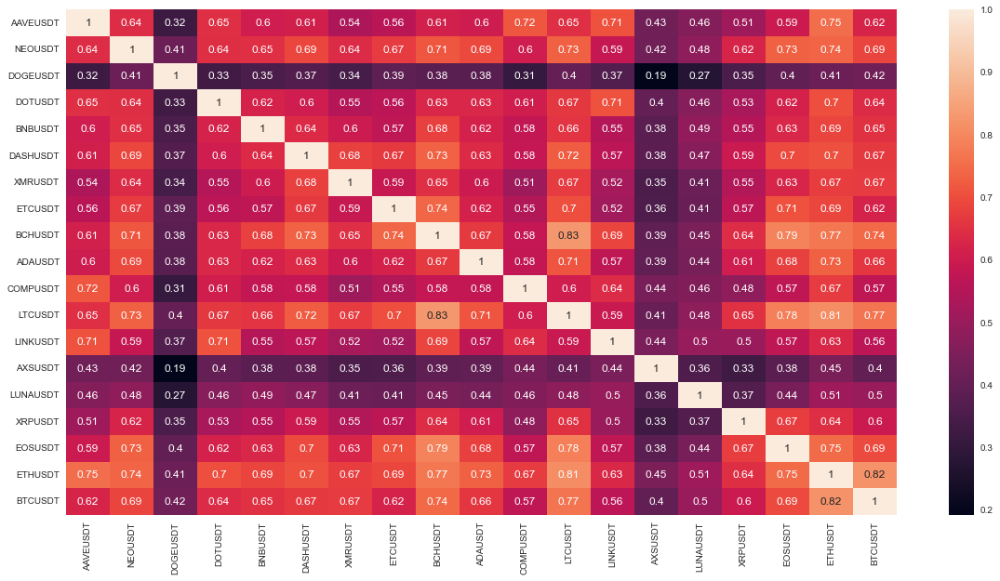

In [12]:
plt.figure(figsize=(20, 10))
sns.heatmap(df_close_prices.corr(method='pearson'), annot = True)

In [13]:
df_close_prices.dropna(axis=0, inplace=True)

In [14]:
df_close_prices

,AAVEUSDT,NEOUSDT,DOGEUSDT,DOTUSDT,BNBUSDT,DASHUSDT,XMRUSDT,ETCUSDT,BCHUSDT,ADAUSDT,COMPUSDT,LTCUSDT,LINKUSDT,AXSUSDT,LUNAUSDT,XRPUSDT,EOSUSDT,ETHUSDT,BTCUSDT
Fecha,,,,,,,,,,,,,,,,,,,
2020-11-06 07:00:00,0.680304,0.656375,0.233484,0.553583,0.589834,0.410116,0.628286,0.434014,0.523134,0.649821,0.542829,0.682772,0.274176,0.335697,0.389011,0.649205,0.518677,0.698202,0.589283
2020-11-10 07:00:00,0.574635,0.563053,0.252141,0.551357,0.563293,0.363195,0.537309,0.367400,0.489224,0.579506,0.600437,0.625669,0.262374,0.184430,0.464358,0.655341,0.515460,0.641179,0.613943
2020-11-10 03:00:00,0.639570,0.517106,0.216096,0.521523,0.533119,0.338315,0.507259,0.372524,0.480388,0.527279,0.534179,0.586282,0.246733,0.329681,0.380226,0.603405,0.495236,0.648057,0.595315
2020-11-09 23:00:00,0.633018,0.556187,0.225560,0.529214,0.571402,0.368123,0.544317,0.396960,0.518864,0.571812,0.592259,0.627497,0.270160,0.463047,0.382592,0.615832,0.507288,0.652471,0.627538
2020-11-09 19:00:00,0.425351,0.533494,0.208198,0.495022,0.538436,0.359807,0.478546,0.359132,0.500142,0.557235,0.483446,0.605527,0.233582,0.172427,0.372253,0.608969,0.499227,0.615943,0.592968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-04 07:00:00,0.556605,0.560189,0.261601,0.584111,0.552803,0.327969,0.574317,0.404524,0.511559,0.656945,0.535200,0.610105,0.272663,0.287205,0.394257,0.734381,0.517946,0.647563,0.600747
2021-12-04 03:00:00,0.197257,0.097171,0.047934,0.243267,0.366981,0.061700,0.158930,0.044676,0.227730,0.194758,0.208200,0.144907,0.043646,0.114954,0.258053,0.304151,0.146101,0.461203,0.281530
2021-12-03 23:00:00,0.490071,0.432900,0.212540,0.490797,0.530048,0.333794,0.562766,0.339809,0.461751,0.507454,0.487790,0.581218,0.235000,0.262070,0.281438,0.592901,0.472416,0.616322,0.590897


In [24]:
from sklearn.cluster import MeanShift

ms_labels = MeanShift().fit_predict(df_close_prices.T.values)
ms_labels

array([0, 0, 2, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 0])

In [53]:
df_close_prices.isna().sum()

AAVEUSDT    0
LTCUSDT     0
LINKUSDT    0
AXSUSDT     0
BCHUSDT     0
DASHUSDT    0
ETHUSDT     0
XRPUSDT     0
XMRUSDT     0
EOSUSDT     0
DOTUSDT     0
NEOUSDT     0
COMPUSDT    0
LUNAUSDT    0
DOGEUSDT    0
BTCUSDT     0
ADAUSDT     0
ETCUSDT     0
BNBUSDT     0
dtype: int64

In [55]:
km.labels_

array([2, 0, 3, 1, 2, 4, 0, 0, 2, 2, 2, 2, 2, 4, 3, 0, 2, 4, 2],
      dtype=int32)

In [56]:
n_clust = 5
km = KMeans(n_clusters=n_clust,random_state=7,init='k-means++') 
km.fit(df_close_prices.T.values) 

#df_close_prices['KMeans_clust'] = km.labels_

list_of_centers = km.cluster_centers_[:,1].tolist()

In [58]:
df_ms_kmeans = pd.DataFrame(columns=df_close_prices.columns, data=[km.labels_])
df_ms_kmeans

,AAVEUSDT,LTCUSDT,LINKUSDT,AXSUSDT,BCHUSDT,DASHUSDT,ETHUSDT,XRPUSDT,XMRUSDT,EOSUSDT,DOTUSDT,NEOUSDT,COMPUSDT,LUNAUSDT,DOGEUSDT,BTCUSDT,ADAUSDT,ETCUSDT,BNBUSDT
0,2,0,3,1,2,4,0,0,2,2,2,2,2,4,3,0,2,4,2


In [25]:
df_ms = pd.DataFrame(columns=df_close_prices.columns, data=[ms_labels])
df_ms

,AAVEUSDT,LTCUSDT,LINKUSDT,AXSUSDT,BCHUSDT,DASHUSDT,ETHUSDT,XRPUSDT,XMRUSDT,EOSUSDT,DOTUSDT,NEOUSDT,COMPUSDT,LUNAUSDT,DOGEUSDT,BTCUSDT,ADAUSDT,ETCUSDT,BNBUSDT
0,0,0,2,2,0,1,0,0,0,0,0,0,0,1,2,0,0,1,0


In [60]:
contador = 0
for i in df_ms_kmeans.columns:
    aux = df_final[df_final.active == i]
    aux['cluster'] = df_ms_kmeans[i][0]
    if contador == 0:
        df_cluster_kmeans = aux.copy()
        contador += 1
    else:
        df_cluster_kmeans = pd.concat([df_cluster, aux], axis = 0)

df_cluster_kmeans

,open,high,low,close,volume,active,day,month,year,weekday,profit,real_volume,close_pct_change,close_scaled,open_scaled,high_scaled,low_scaled,volume_scaled,close_pct_change_scaled,cluster
Fecha,,,,,,,,,,,,,,,,,,,,
2020-10-15 03:00:00,51.4300,59.0000,46.1580,49.0310,25203.494,AAVEUSDT,15,10,2020,Thursday,-4.664593,1.235753e+06,NaN,0.035955,0.039840,0.050520,0.033111,0.033047,NaN,2
2021-10-25 15:00:00,312.1000,316.9000,310.2000,312.4000,15282.570,AAVEUSDT,25,10,2021,Monday,0.096123,4.774275e+06,0.000961,0.453183,0.452749,0.452607,0.465512,0.019097,0.543468,2
2021-10-25 19:00:00,312.4000,312.5000,308.9000,311.6000,7623.416,AAVEUSDT,25,10,2021,Monday,-0.256082,2.375456e+06,-0.002561,0.451916,0.453224,0.445747,0.463384,0.008328,0.534853,2
2021-10-25 23:00:00,311.6000,322.5000,311.1000,322.1000,18258.332,AAVEUSDT,25,10,2021,Monday,3.369705,5.881009e+06,0.033697,0.468550,0.451957,0.461338,0.466986,0.023282,0.623534,2
2021-10-26 03:00:00,321.9000,331.7000,319.6000,330.2000,34300.271,AAVEUSDT,26,10,2021,Tuesday,2.578441,1.132595e+07,0.025147,0.481382,0.468273,0.475681,0.480906,0.045837,0.602623,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-13 23:00:00,276.6430,278.4223,268.0000,273.8594,510866.175,BNBUSDT,13,3,2021,Saturday,-1.006207,1.399055e+08,-0.010062,0.395447,0.399542,0.397639,0.394603,0.091930,0.527024,2
2021-03-14 03:00:00,273.8594,275.0000,267.4855,270.9670,348536.211,BNBUSDT,14,3,2021,Sunday,-1.056162,9.444181e+07,-0.010562,0.391186,0.395441,0.392652,0.393830,0.060976,0.525977,2
2021-02-28 11:00:00,214.4675,218.5000,202.7335,208.5347,903119.677,BNBUSDT,28,2,2021,Sunday,-2.766293,1.883318e+08,-0.027955,0.299210,0.307943,0.310316,0.296538,0.166725,0.489526,2


In [61]:
df_cluster_kmeans.cluster.value_counts()

2    59759
0    29152
4    17771
3    13376
1     3259
Name: cluster, dtype: int64

In [28]:
df_cluster.cluster.value_counts()

0    81623
1    17771
2    16635
Name: cluster, dtype: int64

In [37]:
df_final = df_final_scaled.sort_values(by='active', ascending = True)

df_close_prices = pd.DataFrame(index=df_final[df_final.active == 'BTCUSDT'].index)

for i in set(df_final.active):
    df_close_prices[i] = df_final[df_final.active == i].close_scaled

df_close_prices.dropna(inplace=True)

In [63]:
df_cluster_kmeans.sort_values(by='Fecha', inplace=True)

In [66]:
df_cluster_kmeans

,open,high,low,close,volume,active,day,month,year,weekday,profit,real_volume,close_pct_change,close_scaled,open_scaled,high_scaled,low_scaled,volume_scaled,close_pct_change_scaled,cluster
Fecha,,,,,,,,,,,,,,,,,,,,
2019-01-01 03:00:00,0.03988,0.04068,0.03985,0.04061,1.281178e+07,ADAUSDT,1,1,2019,Tuesday,1.830491,5.202864e+05,NaN,0.006206,0.005975,0.005308,0.007439,0.014139,NaN,2
2019-01-01 03:00:00,7.37400,7.43000,7.35200,7.40900,3.906782e+04,NEOUSDT,1,1,2019,Tuesday,0.474641,2.894535e+05,NaN,0.019068,0.018831,0.015116,0.028266,0.012173,NaN,2
2019-01-01 03:00:00,4.94190,5.11270,4.93790,5.04560,4.550184e+04,ETCUSDT,1,1,2019,Tuesday,2.098383,2.295841e+05,NaN,0.010430,0.009746,0.008979,0.014139,0.002094,NaN,4
2019-01-01 03:00:00,0.34640,0.35368,0.34617,0.35073,5.565085e+06,XRPUSDT,1,1,2019,Tuesday,1.250000,1.951842e+06,NaN,0.125602,0.123187,0.115439,0.147622,0.001039,NaN,0
2019-01-01 03:00:00,5.93170,5.95460,5.85000,5.95030,2.516747e+05,BNBUSDT,1,1,2019,Tuesday,0.313569,1.497540e+06,NaN,0.000758,0.000720,0.000579,0.000716,0.042507,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-02 11:00:00,88.30000,90.30000,87.40000,89.70000,2.188115e+04,DASHUSDT,2,5,2022,Monday,1.585504,1.962740e+06,0.014706,0.123864,0.120525,0.116454,0.138479,0.032233,0.381205,4
2022-05-02 11:00:00,282.60000,287.60000,279.60000,285.40000,1.350215e+04,BCHUSDT,2,5,2022,Monday,0.990800,3.853513e+06,0.009908,0.096006,0.094014,0.080602,0.108471,0.033169,0.531754,2
2022-05-02 11:00:00,104.00000,106.40000,102.90000,105.60000,1.045353e+04,COMPUSDT,2,5,2022,Monday,1.538462,1.103893e+06,0.014409,0.028011,0.026067,0.025554,0.028483,0.052651,0.557329,2


In [64]:
aux1 = df_cluster_kmeans[df_cluster_kmeans.cluster == 0]
aux2 = df_cluster_kmeans[df_cluster_kmeans.cluster == 1]
aux3 = df_cluster_kmeans[df_cluster_kmeans.cluster == 2]
aux4 = df_cluster_kmeans[df_cluster_kmeans.cluster == 3]
aux5 = df_cluster_kmeans[df_cluster_kmeans.cluster == 4]

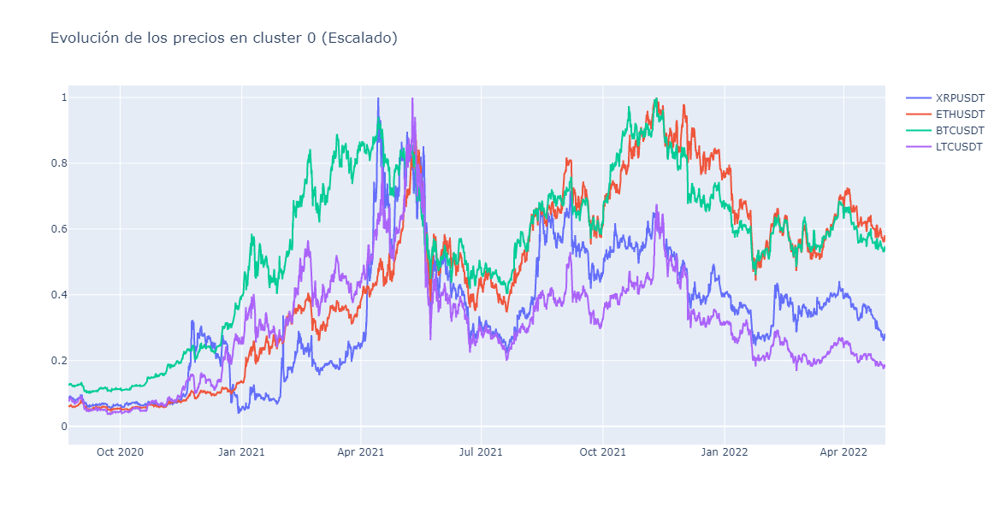

In [69]:
fig = go.Figure()
for active in set(aux1.active):
    aux=df_cluster_kmeans[df_cluster_kmeans.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en cluster 0 (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

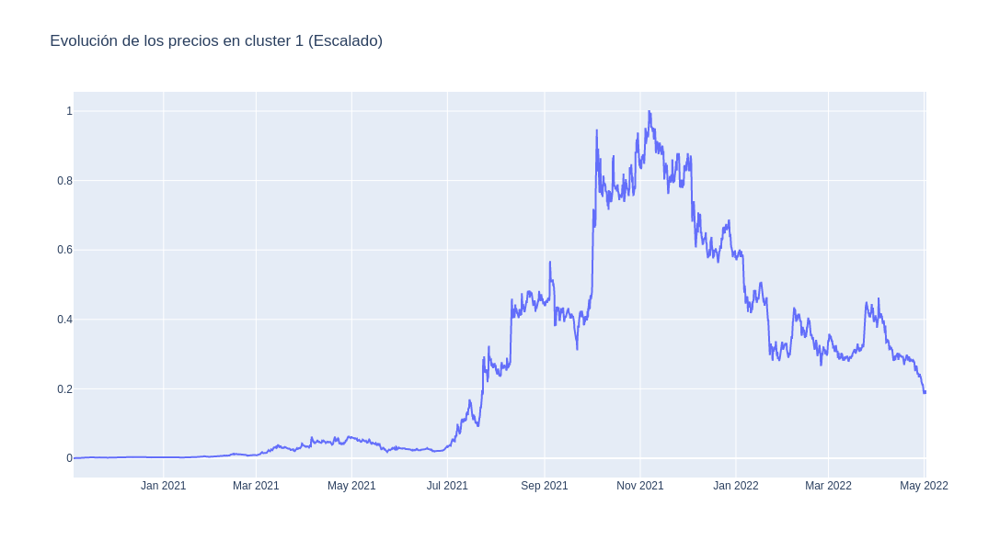

In [70]:
fig = go.Figure()
for active in set(aux2.active):
    aux=df_cluster_kmeans[df_cluster_kmeans.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en cluster 1 (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

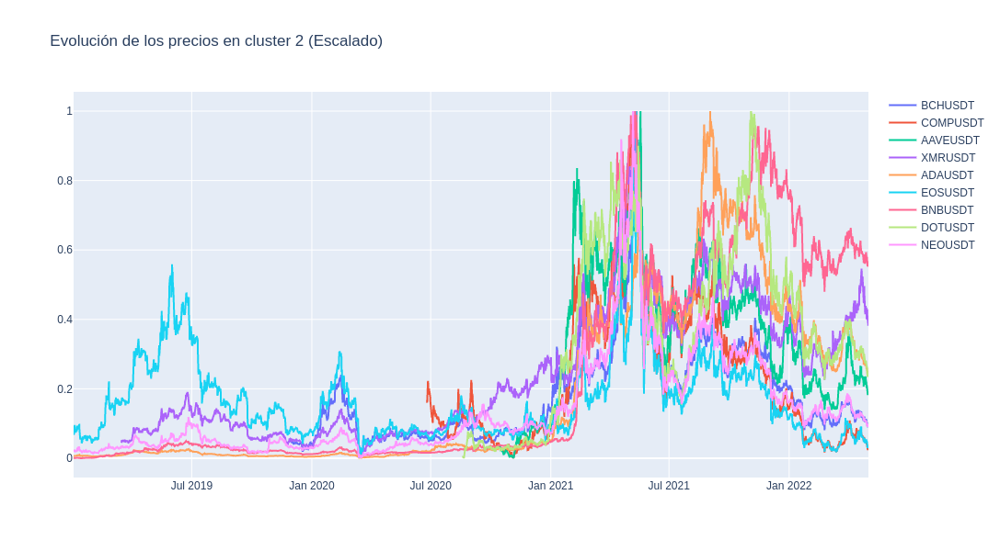

In [71]:
fig = go.Figure()
for active in set(aux3.active):
    aux=df_cluster_kmeans[df_cluster_kmeans.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en cluster 2 (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

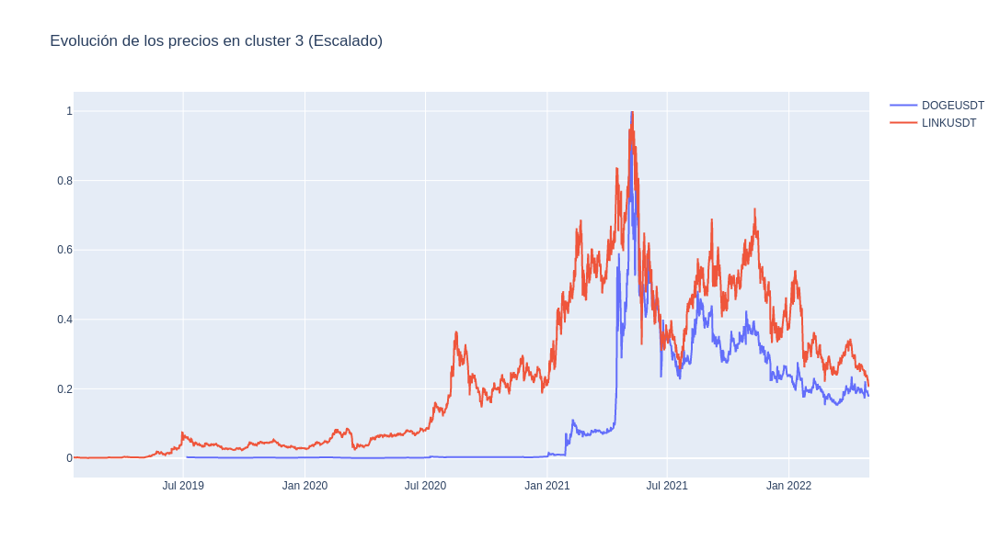

In [75]:
fig = go.Figure()
for active in set(aux4.active):
    aux=df_cluster_kmeans[df_cluster_kmeans.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en cluster 3 (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

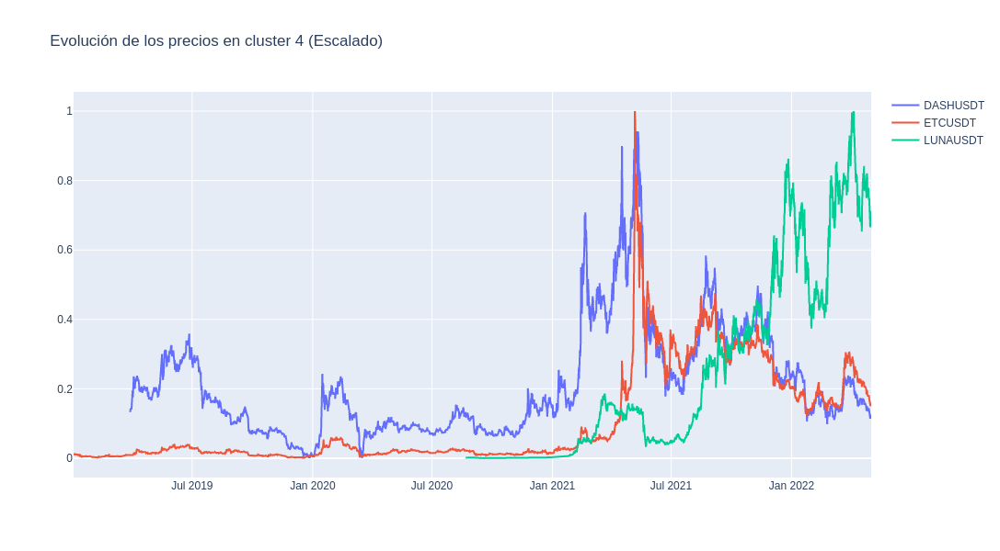

In [76]:
fig = go.Figure()
for active in set(aux5.active):
    aux=df_cluster_kmeans[df_cluster_kmeans.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en cluster 4 (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

In [25]:
n_clusters = len(np.unique(ms_labels))
print(f'Silhouette Score ({n_clusters}): {silhouette_score(df_close_prices.T.values, ms_labels)}')

Silhouette Score (3): 0.5724736891049501


In [133]:
def returns(df):
    df_returns = pd.DataFrame(index=df.index)
    df_returns = df.add(1).cumprod()
    df_returns.columns = [i[:-10] for i in df_returns.columns]
    df_returns_log = np.log10(df_returns)

    return df_returns, df_returns_log

In [127]:
df_close_prices

,LTCUSDT,DASHUSDT,LUNAUSDT,AAVEUSDT,BCHUSDT,BNBUSDT,ETHUSDT,ADAUSDT,NEOUSDT,DOTUSDT,COMPUSDT,DOGEUSDT,EOSUSDT,AXSUSDT,XMRUSDT,LINKUSDT,BTCUSDT,XRPUSDT,ETCUSDT
Fecha,,,,,,,,,,,,,,,,,,,
2022-05-02 11:00:00,0.659903,0.381205,0.422666,0.578745,0.531754,0.557312,0.656300,0.551565,0.569718,0.526011,0.557329,0.216706,0.523573,0.309749,0.570129,0.265923,0.618225,0.604868,0.382642
2021-03-23 23:00:00,0.732015,0.356652,0.371153,0.560188,0.523535,0.557239,0.656200,0.533782,0.572565,0.507677,0.555292,0.215860,0.521571,0.308015,0.527180,0.246243,0.610459,0.595683,0.395690
2021-03-23 19:00:00,0.575405,0.330426,0.225832,0.472291,0.482942,0.520784,0.568898,0.513341,0.485678,0.483358,0.375745,0.209380,0.462973,0.198094,0.483977,0.220745,0.553685,0.595627,0.353350
2021-03-23 15:00:00,0.630801,0.349464,0.383366,0.523999,0.488696,0.534807,0.634728,0.509515,0.520403,0.528676,0.507150,0.210183,0.513793,0.285684,0.557123,0.254143,0.618103,0.569282,0.353088
2021-03-23 11:00:00,0.640818,0.362811,0.369365,0.591508,0.525120,0.551639,0.663598,0.592226,0.561365,0.513951,0.530942,0.228048,0.517930,0.305079,0.586824,0.253572,0.636945,0.600192,0.395179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-15 15:00:00,0.720112,0.407384,0.415750,0.574655,0.555676,0.600593,0.685308,0.612874,0.585839,0.603131,0.621384,0.252651,0.564830,0.297252,0.546351,0.279330,0.688645,0.644731,0.407340
2021-10-15 11:00:00,0.672988,0.385071,0.398444,0.557587,0.529840,0.565905,0.654339,0.569986,0.536871,0.526565,0.549363,0.231238,0.515147,0.263759,0.519801,0.245400,0.648903,0.619053,0.379851
2021-10-15 07:00:00,0.563945,0.315424,0.346678,0.486371,0.462835,0.519310,0.604616,0.506365,0.474524,0.472622,0.486828,0.200100,0.432048,0.261378,0.594191,0.232422,0.589329,0.580409,0.322021


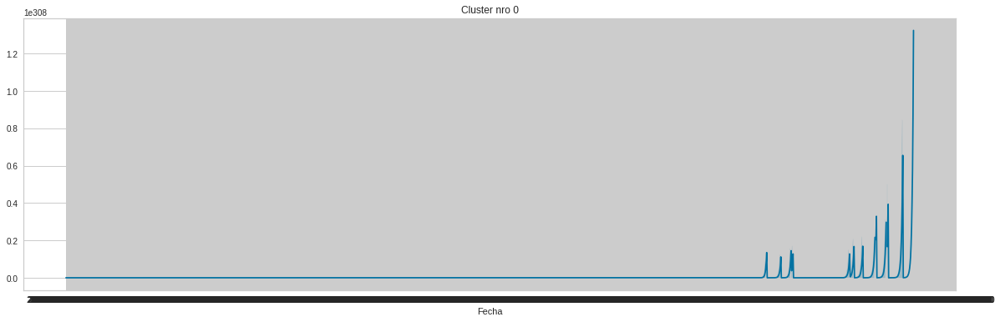

OverflowError: cannot convert float infinity to integer

<Figure size 1440x432 with 1 Axes>

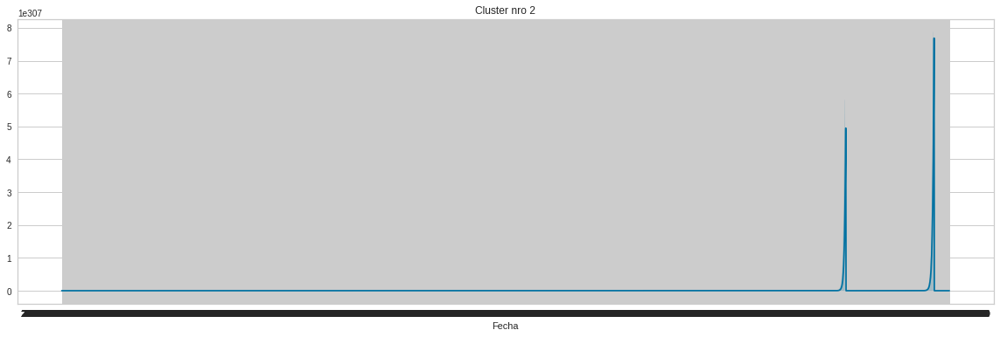

In [134]:
# Ploteamos cada cluster de forma agrupada
for c in np.unique(ms_labels):
    fig = plt.figure(figsize=(20,6))
    returns_cluster, otro = returns(df_close_prices.loc[:, df_ms.loc[0] == c])
    sns.lineplot(data=returns_cluster)
    plt.title(f'Cluster nro {c}')

In [22]:
columns = ['open_scaled', 'high_scaled', 'low_scaled', 'close_scaled', 'volume_scaled']
columns_active = ['open_scaled', 'high_scaled', 'low_scaled', 'close_scaled', 'volume_scaled', 'active']

In [23]:
df_new = df_final_scaled[columns]
info_df = df_final_scaled[columns_active]

In [24]:
from yellowbrick.cluster import KElbowVisualizer

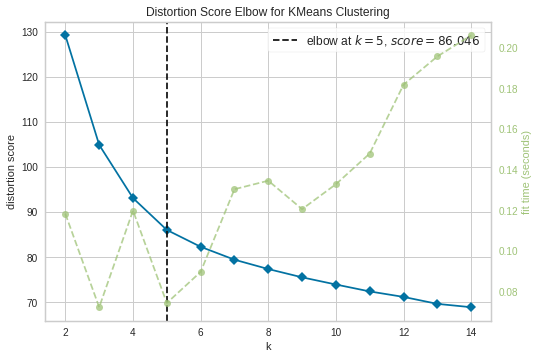

In [109]:
model = KMeans(random_state=7)
visualizer = KElbowVisualizer(model, k=(2,15))

visualizer.fit(df_close_prices)
visualizer.show()
plt.show()

In [112]:
n_clust = 5
km = KMeans(n_clusters=n_clust,random_state=7,init='k-means++') 
km.fit(df_close_prices) 

df_close_prices['KMeans_clust'] = km.labels_

list_of_centers = km.cluster_centers_[:,1].tolist()

In [114]:
df_close_prices.KMeans_clust.value_counts()

2    1231
0    1175
1     447
3     347
4      58
Name: KMeans_clust, dtype: int64

In [36]:
v[info_df['active'] == 'BTCUSDT'].KMeans_clust.value_counts()

0    3981
3    1742
2    1204
1     361
Name: KMeans_clust, dtype: int64

In [115]:
df_close_prices

,LTCUSDT,DASHUSDT,LUNAUSDT,AAVEUSDT,BCHUSDT,BNBUSDT,ETHUSDT,ADAUSDT,NEOUSDT,DOTUSDT,COMPUSDT,DOGEUSDT,EOSUSDT,AXSUSDT,XMRUSDT,LINKUSDT,BTCUSDT,XRPUSDT,ETCUSDT,KMeans_clust
Fecha,,,,,,,,,,,,,,,,,,,,
2022-05-02 11:00:00,0.659903,0.381205,0.422666,0.578745,0.531754,0.557312,0.656300,0.551565,0.569718,0.526011,0.557329,0.216706,0.523573,0.309749,0.570129,0.265923,0.618225,0.604868,0.382642,0
2021-03-23 23:00:00,0.732015,0.356652,0.371153,0.560188,0.523535,0.557239,0.656200,0.533782,0.572565,0.507677,0.555292,0.215860,0.521571,0.308015,0.527180,0.246243,0.610459,0.595683,0.395690,0
2021-03-23 19:00:00,0.575405,0.330426,0.225832,0.472291,0.482942,0.520784,0.568898,0.513341,0.485678,0.483358,0.375745,0.209380,0.462973,0.198094,0.483977,0.220745,0.553685,0.595627,0.353350,1
2021-03-23 15:00:00,0.630801,0.349464,0.383366,0.523999,0.488696,0.534807,0.634728,0.509515,0.520403,0.528676,0.507150,0.210183,0.513793,0.285684,0.557123,0.254143,0.618103,0.569282,0.353088,2
2021-03-23 11:00:00,0.640818,0.362811,0.369365,0.591508,0.525120,0.551639,0.663598,0.592226,0.561365,0.513951,0.530942,0.228048,0.517930,0.305079,0.586824,0.253572,0.636945,0.600192,0.395179,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-15 15:00:00,0.720112,0.407384,0.415750,0.574655,0.555676,0.600593,0.685308,0.612874,0.585839,0.603131,0.621384,0.252651,0.564830,0.297252,0.546351,0.279330,0.688645,0.644731,0.407340,3
2021-10-15 11:00:00,0.672988,0.385071,0.398444,0.557587,0.529840,0.565905,0.654339,0.569986,0.536871,0.526565,0.549363,0.231238,0.515147,0.263759,0.519801,0.245400,0.648903,0.619053,0.379851,0
2021-10-15 07:00:00,0.563945,0.315424,0.346678,0.486371,0.462835,0.519310,0.604616,0.506365,0.474524,0.472622,0.486828,0.200100,0.432048,0.261378,0.594191,0.232422,0.589329,0.580409,0.322021,1


In [ ]:
ms_labels = MeanShift().fit_predict(df_close_prices.T.values)

<AxesSubplot:xlabel='open_scaled', ylabel='close_scaled'>

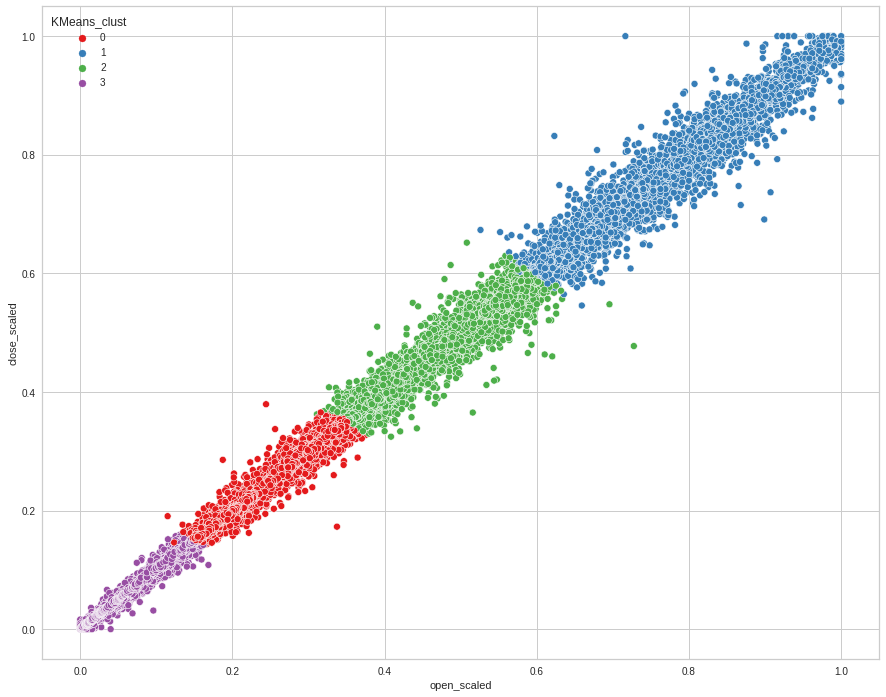

In [30]:
from matplotlib.pyplot import figure
figure(figsize=(15, 12))
sns.scatterplot('open_scaled', 'close_scaled', data=df_close_prices,
            hue='KMeans_clust', palette='Set1', legend='full')

In [ ]:
scaler = MinMaxScaler()
i = 0
for active in set(df.active):
    
    df_aux = df_filtered[df_filtered.active == active]
    df_aux['close_scaled'] = scaler.fit_transform(df_aux['close'].values.reshape(-1, 1))
    if i == 0:
        df_final_scaled = df_aux.copy()
        i += 1
    else:
        df_final_scaled = pd.concat([df_final_scaled, df_aux])

df_final_scaled

In [22]:
def clustering(data, symbols, clustering_method='tskmeans_euclidean', scaler='minmax', n_clusters=2):
    only_close = len(data.shape)==2
    
    if (scaler == 'minmax'):
        scaler = TimeSeriesScalerMinMax()
        data_scaled = scaler.fit_transform(data)
    elif(scaler == 'standart'):
        scaler = TimeSeriesScalerMeanVariance()
        data_scaled = scaler.fit_transform()
    else:
        print("uncorrect scaler")
        return 0
    
    if (clustering_method=='tskmeans_euclidean'):
        clusterer = TimeSeriesKMeans(n_clusters, n_init=100, metric='euclidean', n_jobs=-1)
    elif (clustering_method=='kmeans'):
        if (not(only_close)):
            data_scaled = data_scaled.swapaxes(2, 1).reshape(data_scaled.shape[0], -1)
        clusterer = KMeans(n_init=100, n_clusters=n_clusters)

    clusterer.fit(data_scaled)
    clusters = clusterer.predict(data_scaled)
    clusters_names = ['Clusters without BTC', 'Clusters without BTC']
    clusters_names[clusters[np.where(symbols=='BTCUSDT')[0][0]]] = 'Cluster with BTC'

    for cluster_number in range(n_clusters):
        print(f"Cluster name: {clusters_names[cluster_number]}") 

        if (only_close == False):
            plot_cluster_tickers(data[(clusters == cluster_number).nonzero(), :, 0][0, :, :], symbols[(clusters == cluster_number).nonzero()])
        else:
            plot_cluster_tickers(data[(clusters == cluster_number).nonzero()], symbols[(clusters==cluster_number).nonzero()])
    
    return data_scaled, symbols, clusters

In [23]:
activos = set(list(df.active))

In [ ]:
scaler = TimeSeriesScalerMinMax()
data_scaled = scaler.fit_transform(data)
df['close_scaled'] = scaler.fit_transform(df.groupby(['active'], as_index=False)['close']

In [29]:
df.groupby(['active'], as_index=False)['close']

In [27]:
coins_scaled_flattened, symbols, clasters_kmeans = clustering(df[columns], activos)

IndexError: index 0 is out of bounds for axis 0 with size 0

### Load Data

In [7]:
coins, symbols, timesteps = coins_data_USDT('10 Aug, 2021', '18 Oct, 2021', Client.KLINE_INTERVAL_1HOUR, only_close=False)


KeyboardInterrupt

